# Projeto 2

### Alunos:
- Gabriel Alves Kuabara - 11275043
- Ana Laura Chioca Vieira - 9866531
- Raíssa Torres Barreira - 11796336

## Introdução

Sobre os datasets usados, escolhemos usar o dataset do Spotify disponibilizado no enunciado do projeto: https://www.kaggle.com/datasets/zaheenhamidani/ultimate-spotify-tracks-db

Ademais, usamos um outro dataset alternativo do spotify, de maneira complementar, que também foi encontrado no kaggle: https://www.kaggle.com/datasets/lehaknarnauli/spotify-datasets?select=tracks.csv.

A diferença se encontra no número maior de tracks, e contém mais duas features, entre elas, a "release_date" que vai ser importante para nossa visualização.

Durante o desenvolvimento e testes, através de testes, percebemos que os datasets usados estavam majoritariamente limpos, com nenhuma ou não significativa falta de dados, o que ajudou bastante no processo. Além disso, não realizamos nenhum normalização ou padronização, pois não se adequava as visualizações que projetamos. Sobre transformações em dimensionalidade também não julgamos necessário, apesar de implicitamente termos usado um algoritmo de agrupamento mostrado adiante.

## Pré-Processamento de dados

Começamos apenas fazendo os imports de todas as bibliotecas usadas ao longo do projeto.

In [1]:
# Imports
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
import plotly
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import VBox, HBox, widgets
from scipy.cluster.hierarchy import dendrogram, linkage

import warnings
warnings.filterwarnings("ignore")

Fazendo a leitura dos dois datasets descritos:

In [2]:
# Crio os datasets
df1 = pd.read_csv('tracks.csv')
df2 = pd.read_csv('SpotifyFeatures.csv')

# Seleciono apenas as features importantes do dataset auxiliar
df1 = df1[['id', 'release_date']]
print("df1 shape:", df1.shape, "df2 shape:", df2.shape)

df1 shape: (586672, 2) df2 shape: (232725, 18)


Faço a junção dos dois datasets pelo 'id' das tracks, fazendo com que fiquem apenas as músicas que estão incluídas em ambos datasets. A partir desse momento, todas as músicas do dataset principal contém datas de lançamento das músicas e gêneros.

In [3]:
df = df2.merge(df1, how='inner', left_on='track_id', right_on='id')
print(df.shape)

(52452, 20)


Faço a limpeza das linhas com campos vazios e verificamos a quantidade de dados perdida (cerca de 71 linhas).

In [4]:
df.dropna(inplace=True) # Apago linhas vazias (quantidades insignificativas)
df.drop('id', axis=1, inplace=True) # Retiro o 'id' replicado
df = df[df['genre'].str.contains('Children\'s Music')==False] # Retiro todas as músicas do gênero replicado
df = df[df['genre'].str.contains("Children’s Music")==False]
print(df.shape)

(49369, 19)


Deixo armazenada uma cópia do dataset limpo para usarmos nas nossas diversas representações. A partir desse momento, temos nosso dataset pronto de maneira geral para ser manipulado como quiser.

In [5]:
cp = df.copy()
df.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,release_date
0,R&B,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,65,0.083,0.724,246333,0.689,0.0,D,0.304,-5.922,Minor,0.135,146.496,4/4,0.693,2005-01-01
1,Dance,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,64,0.083,0.724,246333,0.689,0.0,D,0.304,-5.922,Minor,0.135,146.496,4/4,0.693,2005-01-01
2,Hip-Hop,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,65,0.083,0.724,246333,0.689,0.0,D,0.304,-5.922,Minor,0.135,146.496,4/4,0.693,2005-01-01
3,Pop,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,65,0.083,0.724,246333,0.689,0.0,D,0.304,-5.922,Minor,0.135,146.496,4/4,0.693,2005-01-01
4,Soul,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,65,0.083,0.724,246333,0.689,0.0,D,0.304,-5.922,Minor,0.135,146.496,4/4,0.693,2005-01-01


## Relação de gênero por década

Num primeiro momento, pensamos em que tipo de dados visuais poderíamos extrair desses dados. Então, começamos por tentar entender como se deu a evolução da produção de músicas ao longo do tempo, por isso decidimos visualizar a quantidade de músicas que foram produzidas por cada gênero por década. Para dar forma a nossa idéia, nos dedicamos a criar um bar plot que fosse empilhado por barras de cores diferentes, assim, cada barra estará dividida em cores e cada cor representará os valores absolutos das quantidades de músicas produzidas por gênero. Julgamos que essa forma de representar os dados seria simples por se tratar de um bar plot e podemos mostrar mais de uma dimensão do problema usando de cores diferentes.

De início, precisamos achar as décadas que foram produzidas as tracks. Então, queremos separar as datas de lançamento das músicas somente por ano. Para isso, vamos criar uma nova coluna somente com essa informação e excluir a coluna de data de lançamento. Além disso, nosso objetivo final é sumarizar esses anos por décadas a partir dos anos 1950. Então vamos dividir as datas por 10 e excluir aquelas fora do intervalo de anos, obtendo as décadas da produção das tracks.

In [6]:
df = cp.copy()
years = [int(year.split('-')[0]) for year in df['release_date']] # Seleciono apenas o valor do ano de todas as células de data
df['release_year'] = years # Adiciono uma nova coluna de ano para o dataset
df.drop('release_date', axis=1, inplace=True) # Deleto a coluna de data
df.drop(df[(df['release_year'] < 1950)].index, inplace=True) # Deleto as linhas cuja música é de antes da década de 50's
df['decade'] = df['release_year'] // 10 # Divido por 10 para os anos virarem décadas

df.shape

(49214, 20)

Agora que reduzimos o tamanho do dataset excluindo as músicas que foram produzidas antes de 1950, podemos agrupar nossos dados por gênero e década, fazendo uma operação de contagem. Dessa forma, vamos obter a quantidade de músicas que tinha por época de um determinado gênero.

In [7]:
df = df.groupby(['decade','genre'], as_index=False).count() # Agrupo por década e gênero fazendo a contagem
df = pd.DataFrame(df[['decade','genre','track_id']]) # Seleciono features úteis
df.rename(columns={'track_id':'count'}, inplace=True) # Renomeio coluna pela semântica do dataset
df.head()

,decade,genre,count
0,195,Blues,192
1,195,Classical,60
2,195,Comedy,2
3,195,Country,31
4,195,Folk,17


Depois do agrupamento, iremos selecionar por década os 5 gêneros que mais tiveram músicas lançadas, pois isso iria deixar nosso plot mais interpretável e menos poluído. Portanto, nesse momento temos um dataset que cada linha representa a quantidade de músicas de um gênero numa determinada época. Contudo, não é possível é gerar o gráfico que queremos a partir dessa organização do dataset, precisando reestrutura-lo.

In [8]:
df['ranking'] = df.groupby(['decade'])['count'].rank(method='average', ascending=False) # Crio uma coluna para ranquear os gêneros com mais músicas de cada década
df.drop(df[df.ranking >= 6.0].index, inplace=True) # Seleciono apenas os 5 gêneros com mais músicas por década
df.drop('ranking', axis=1, inplace=True)
df.reset_index(drop=True, inplace=True)
df.head()

,decade,genre,count
0,195,Blues,192
1,195,Classical,60
2,195,Jazz,302
3,195,Opera,144
4,195,Soul,61


O próximo passo é transformar nossos dados categóricos em dados númericos para que possam ser representados como quantidades. Então, fazemos um One-hot Encoding, transformando cada label da coluna 'genre' em colunas com valores binários que dizem se uma track é daquele gênero ou não.

In [9]:
# Armazeno os nomes das colunas
columns = df['genre'].unique()
columns.sort()
df = pd.get_dummies(df, columns=['genre'])
temp = ['decade','count']
temp.extend(columns)
df.columns = temp
df.head()

,decade,count,Alternative,Blues,Classical,Dance,Folk,Hip-Hop,Jazz,Opera,Pop,Rap,Rock,Ska,Soul
0,195,192,0,1,0,0,0,0,0,0,0,0,0,0,0
1,195,60,0,0,1,0,0,0,0,0,0,0,0,0,0
2,195,302,0,0,0,0,0,0,1,0,0,0,0,0,0
3,195,144,0,0,0,0,0,0,0,1,0,0,0,0,0
4,195,61,0,0,0,0,0,0,0,0,0,0,0,0,1


Ademais, queremos já atribuir quantas músicas foram produzidas daquele gênero no lugar do valor binário que representa a qual gênero pertence a linha.

In [10]:
# Coloco o count no lugar do binário que diz a qual gênero pertence a linha, através da multiplicação pelo count
for (colname,colval) in df.iteritems():
    if colname is not 'decade' and colname is not 'count':
        df[colname] = colval * df['count']
df.head()

,decade,count,Alternative,Blues,Classical,Dance,Folk,Hip-Hop,Jazz,Opera,Pop,Rap,Rock,Ska,Soul
0,195,192,0,192,0,0,0,0,0,0,0,0,0,0,0
1,195,60,0,0,60,0,0,0,0,0,0,0,0,0,0
2,195,302,0,0,0,0,0,0,302,0,0,0,0,0,0
3,195,144,0,0,0,0,0,0,0,144,0,0,0,0,0
4,195,61,0,0,0,0,0,0,0,0,0,0,0,0,61


Já substituimos a coluna do count nas próprias colunas geradas pelo One-hot Encoding, então podemos excluí-las.

In [11]:
df.drop('count', axis=1, inplace=True)

Por fim, podemos agrupar todas as linhas de uma mesma década somando-as. Consequentemente, teremos uma tabela que cada coluna é um gênero e as células nos dizem a quantidade de músicas que foram produzidas de determinado gênero naquela década, sendo exatamente o que já haviamos, só que estruturamos de maneira útil ao nosso plot.

In [12]:
df = df.groupby(['decade'], as_index=True).sum().sort_values(by='decade', ascending=True)
df

,Alternative,Blues,Classical,Dance,Folk,Hip-Hop,Jazz,Opera,Pop,Rap,Rock,Ska,Soul
decade,,,,,,,,,,,,,
195,0,192,60,0,0,0,302,144,0,0,0,0,61
196,0,650,0,0,366,0,476,0,0,0,356,0,358
197,0,1282,0,0,832,0,439,0,0,0,865,0,453
198,0,433,345,0,333,0,0,0,0,0,695,294,0
199,899,0,0,0,0,530,551,0,0,0,836,0,586
200,1276,0,0,971,0,0,0,0,962,971,1352,0,0
201,0,0,0,1696,0,1455,0,0,3390,1768,1271,0,0


Finalmente realizando o bar plot como descrevemos anteriormente:

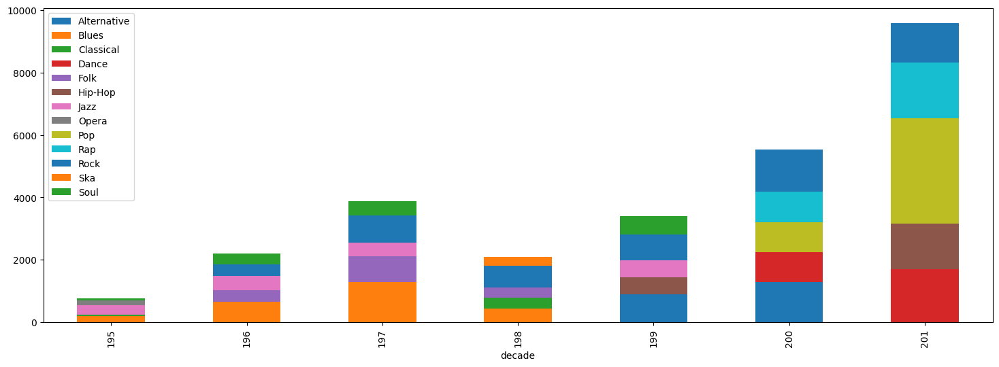

In [13]:
ax = df.plot.bar(figsize=(18,6), stacked=True)

Através desse gráfico, podemos concluir que tivemos nas décadas mais recentes houve maior produção de tracks armazenadas e ainda que houve uma grande mudança na produção de tracks ao longo do tempo. É fácil visualizar pelas cores que os gêneros mais produzidos a partir da década de 80's tem alterado bastante até os dias atuais, além das quantidades que tem crescido também.

## Relação de popularidade por gênero

Em seguida, pensamos que uma das informações mais legais de sabermos em relação a um database tão grande como o do spotify, seria quais os gêneros mais populares no sistema deles. Para isso, iremos realizar um plot similar, o Lollipop plot que pensamos ser bom para comparação devido as popularidades parecida, já que as bolas dos "pirulitos" nos ajudariam a distinguir melhor os valores de cada barra. Além disso, podemos disponibilizar o gráfico de maneira ordenada, o que ajuda na clareza e organização do plot.

Começamos copiando o dataset limpo e agrupando todas as linhas do mesmo gênero, somando as popularidades.

In [14]:
df_sum = cp.copy()
df_sum = df_sum.groupby(['genre'], as_index=False).sum() # Agrupamento por gênero e somando as linhas de cada gênero
df_sum = pd.DataFrame(df_sum[['genre','popularity']]) # Seleciono somente as features que me importam
df_sum.rename(columns={'popularity':'popularity_sum'}, inplace=True) # Mudo nome da coluna pela semântica
df_sum.head()

,genre,popularity_sum
0,Alternative,174912
1,Anime,31643
2,Blues,127384
3,Classical,47941
4,Comedy,2240


Em seguida, fazemos praticamente o mesmo, só que agrupando por gênero e fazendo a contagem de quantas linhas há por gênero.

In [15]:
df_count = cp.copy()
df_count = df_count.groupby(['genre'], as_index=False).count() # Agrupamento por gênero e conto as linhas de cada gênero
df_count = pd.DataFrame(df_count[['genre','popularity']]) # Seleciono somente as features que me importam
df_count.rename(columns={'popularity':'count'}, inplace=True) # Mudo nome da coluna pela semântica
df_count.head()

,genre,count
0,Alternative,3203
1,Anime,843
2,Blues,3240
3,Classical,1203
4,Comedy,65


Então, juntamos os datasets, calculamos a média da popularidade para cada gênero e ordenamos os valores para serem representados no gráfico.

In [16]:
df = df_sum.merge(df_count, how='inner') # Junto os datasets
df['mean_popularity'] = df['popularity_sum'] / df['count'] # Calcula a média da popularidade divindo as células da coluna da soma de popularidade pela coluna de contagem
df.sort_values('mean_popularity', inplace=True, ascending=False) # Ordeno os valores
df.head()

,genre,popularity_sum,count,mean_popularity
14,Pop,336028,4890,68.717382
16,Rap,206785,3199,64.640513
9,Hip-Hop,179410,2857,62.796640
6,Dance,215364,3466,62.136180
19,Rock,331056,5388,61.443207


Por fim, fazemos a apresentação da popularidade média de cada gênero através do Lollipop plot:

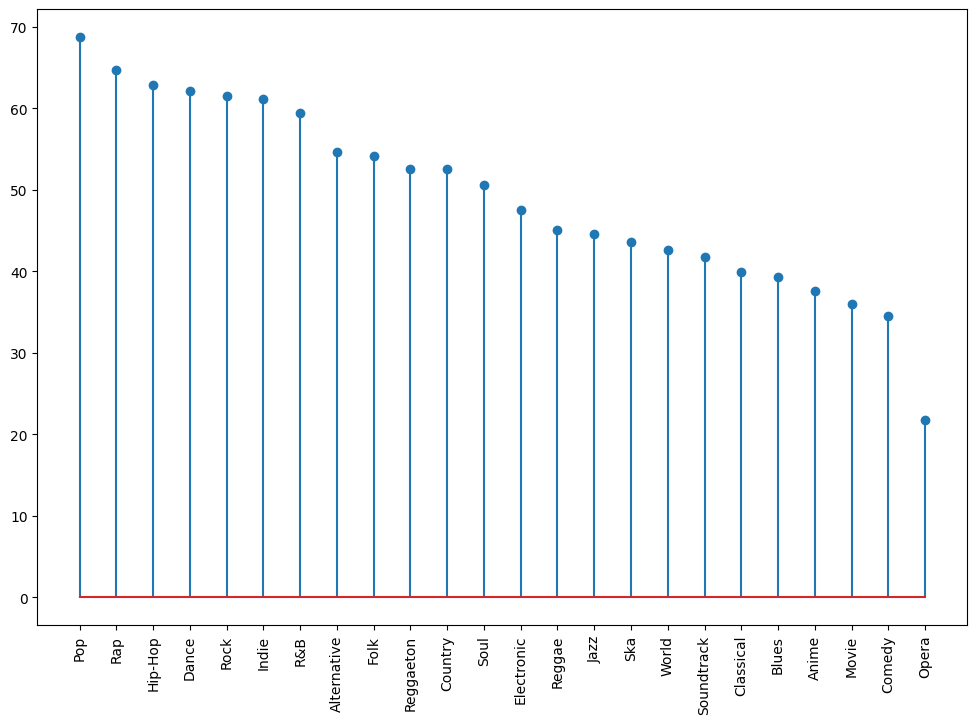

In [17]:
plt.figure(figsize=(12, 8))
my_range = range(0,len(df.index))
plt.stem(df['mean_popularity'])
plt.xticks(my_range, df['genre'], rotation='vertical')
plt.plot();

Como podemos ver, temos muitos gêneros cujo as popularidades médias se aproximam. Por isso a decisão de utilizar um Lollipop plot se torna eficaz na medida que as bolas ajudam a destacar o pico do valor de cada barra. Através dessa visualização intuitiva fica fácil comparar quaisquer gêneros.

## Relação entre gêneros

Outra aplicação muito interessante com o dataset, é visualizar como os gêneros são parecidos entre si em questão de características providas pelas próprias ondas sonoras. Para mostrar essa visualização, utilizamos de um dendograma que constrói esse relacionamento através de um esquema de árvore. Esse tipo de visualização se torna eficaz na proposta, pois precisamos agrupar gêneros (categóricos) com base na sua similaridade, o que é exatamente o propósito desse plot, que demonstra de maneira simples como podemos enxergar a relação entre gêneros de acordo com os níveis de parentesco na árvore.

Para começar, copiamos o dataset limpo e excluímos todas as colunas que não são utilizáveis para nosso propósito, como aquelas que possuem valores categóricos e informações que não dizem respeito as propriedades da música. A decisão foi baseada na descrição das features do dataset no site do Spotify.

Além disso, agrupamos todas as linhas pelo gênero calculando a média para cada atributo.

In [18]:
df = cp.copy()
df.drop(['artist_name','track_name','track_id','release_date','mode','key','time_signature','popularity','duration_ms','tempo','loudness'], axis=1, inplace=True)
df = df.groupby(['genre'], as_index=True).mean() # Agrupando por gênero e calculando a média das features
df.head()

,acousticness,danceability,energy,instrumentalness,liveness,speechiness,valence
genre,,,,,,,
Alternative,0.121949,0.522582,0.748473,0.068631,0.202570,0.081483,0.473705
Anime,0.190249,0.520025,0.751517,0.067760,0.203830,0.057408,0.525295
Blues,0.374379,0.537892,0.550465,0.086174,0.215204,0.056484,0.619374
Classical,0.831143,0.310622,0.213446,0.614981,0.164471,0.051226,0.245364
Comedy,0.686157,0.535862,0.618523,0.000052,0.542062,0.499465,0.497305


Portanto, podemos usar as funções disponibilizadas no ***scipy.cluster.hierarchy*** que calculam a proximidade dos gêneros conforme os atributos do dataset e constroem o plot com base nisso.

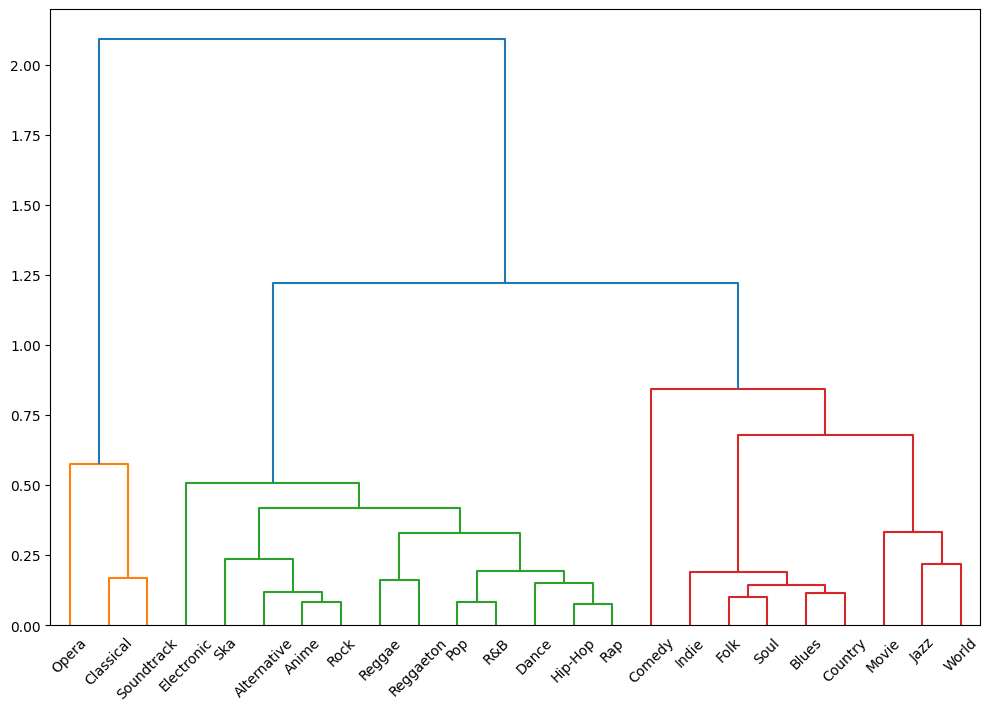

In [19]:
plt.figure(figsize=(12, 8))
Z = linkage(df, 'ward') # Calcula a distância entre cada gênero
dendrogram(Z, truncate_mode='level', leaf_font_size=10, labels=df.index, color_threshold=1.0) # Plot cada nó folha
plt.show()

Fazendo uma análise do gráfico, a primeira divisão da árvore já nos diz respeito a tracks cujo são mais sonoras apenas ou tem alguma voz que se refere a feature 'speechiness'. Em amarelo se encontra tracks cujo não tem vozes usualmente. Já a divisão da sub-árvore a direita, podemos relaciona-la quanto a diferença de ritmos. Gêneros como rock, alternativa e eletronic apresentam ritmos bem mais acelerados e intensos em comparação a gêneros como indie, country e faz. Já nas sub-árvores de cada cor, as diferenças são bem mais sutis, o que necessita uma análise mais a fundo de cada gênero musical.Por exemplo, rock e anime os quais tem estilos que levam instrumentos musicais como guitarra, baixo, bateria, entre outros, apresentam-se bem similares, junto com alternative que também segue esse estilo de instrumentos. Já, a similaridade entre hip-hop e rap é trivialmente conhecida, se assemelhando também ao dance e subindo na árvore a pop e R&B.

# PARTE 2 DO TRABALHO

In [20]:
slider = widgets.FloatSlider(value=1,
                           min=0,
                           max=2,
                           step=0.1,
                           description='Color Threshold:',
                           disabled=False)

def plot_den(color=1.0):
    plt.figure(figsize=(12, 8))
    Z = linkage(df, 'ward') # Calcula a distância entre cada gênero
    dendrogram(Z, truncate_mode='level', leaf_font_size=10, labels=df.index, color_threshold=color) # Plot cada nó folha
    plt.show()

In [21]:
widgets.interact(plot_den, color=slider)

interactive(children=(FloatSlider(value=1.0, description='Color Threshold:', max=2.0), Output()), _dom_classes…

<function __main__.plot_den(color=1.0)>

In [22]:
slider = widgets.IntSlider(value=5,
                           min=1,
                           max=10,
                           step=1,
                           description='Genres per decade:',
                           disabled=False)
                           
def plot_bar(number=5.0):
    df = cp.copy()
    df['release_year'] = [int(year.split('-')[0]) for year in df['release_date']] # Seleciono apenas o valor do ano de todas as células de data
    df.drop('release_date', axis=1, inplace=True) # Deleto a coluna de data
    df.drop(df[(df['release_year'] < 1950)].index, inplace=True) # Deleto as linhas cuja música é de antes da década de 50's
    df['decade'] = df['release_year'] // 10 # Divido por 10 para os anos virarem décadas

    df = df.groupby(['decade','genre'], as_index=False).count() # Agrupo por década e gênero fazendo a contagem
    df = pd.DataFrame(df[['decade','genre','track_id']]) # Seleciono features úteis
    df.rename(columns={'track_id':'count'}, inplace=True) # Renomeio coluna pela semântica do dataset

    df = df.sort_values('count',ascending = False).groupby('decade').head(number)
    df.reset_index(drop=True, inplace=True)

    # Armazeno os nomes das colunas
    columns = df['genre'].unique()
    columns.sort()
    df = pd.get_dummies(df, columns=['genre'])
    temp = ['decade','count']
    temp.extend(columns)
    df.columns = temp
    
    for (colname,colval) in df.iteritems():
        if colname is not 'decade' and colname is not 'count':
            df[colname] = colval * df['count']
    df.drop('count', axis=1, inplace=True)
    df = df.groupby(['decade'], as_index=True).sum().sort_values(by='decade', ascending=True)
    ax = df.plot.bar(figsize=(18,6), stacked=True)

In [23]:
widgets.interact(plot_bar, number=slider)

interactive(children=(IntSlider(value=5, description='Genres per decade:', max=10, min=1), Output()), _dom_cla…

<function __main__.plot_bar(number=5.0)>

In [24]:
class App(object):
    
    def __init__(self, data: pd.DataFrame):
        self.data = data

        # Armazenando vetor dos gêneros
        self.genre = sorted(data['genre'].unique())

        self.data['release_year'] = [int(year.split('-')[0]) for year in self.data['release_date']] # Crio uma coluna com o ano de lançamento de cada track
        self.data = self.data.sort_values('popularity',ascending = False) # Ordeno as trakcs por popularidade e gênero

        # Atribuindo cores para cara gênero
        palette = px.colors.qualitative.Light24
        self.data['color'] = [palette[self.genre.index(genre)] for genre in self.data['genre']]
        
        self.selection = self.data.copy(deep=True)
        self.current_df = self.query(self.data)
                        
    def show(self):
        self.layout = VBox([
            self.toolbar,
            self.scatter])  # Row 1: scatter plot
        return self.layout
    
    def query(self, data, num=1):
        self.current_df = self.selection.copy(deep=True)
        self.current_df = data.groupby('genre').head(num) # Seleciono as 'n' tracks com maior popularidade por gênero
        return self.current_df

app = App(cp)

In [25]:
def graph():
    print("to na graph")
    app.scatter = go.FigureWidget(px.scatter(data_frame=app.current_df,
        x='release_year', y='popularity',
        hover_name='track_name',
        color_discrete_sequence=px.colors.qualitative.Light24,
        color='genre',
        hover_data={'artist_name':True,
                    'genre':True,
                    'release_year':True,
                    'popularity':True
                    },
        labels={
            "x": "Ano de Lançamento",
            "y": "Popularidade",
            "color": "Gênero"},
        title="Most popular tracks per genre",
        orientation='v',
        width=1200,
        height=600))

In [26]:
app.slider = widgets.IntSlider(
    value=1,
    min=1,
    max=10,
    step=1,
    description='Tracks per Genre',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d')

app.toolbar = HBox([app.slider])

In [27]:
def on_num_change(num):        
    print("to na on_num_change")
    with app.scatter.batch_animate():
        app.scatter.data = app.query(app.data, num) 
        
widgets.interact(graph, num=app.slider)

app.slider.observe(on_num_change, 'value')

VBox([app.toolbar, app.scatter])

interactive(children=(Output(),), _dom_classes=('widget-interact',))

In [28]:
app.show()

In [29]:
df = cp.copy()
df.drop(['artist_name','track_name','track_id','release_date','mode','key','time_signature','popularity','duration_ms','tempo','loudness'], axis=1, inplace=True)
df = df.groupby(['genre'], as_index=True).mean() # Agrupando por gênero e calculando a média das features

slider = widgets.FloatSlider(value=1,
                           min=0,
                           max=2,
                           step=0.1,
                           description='Color Threshold:',
                           disabled=False)

def plot_den(color=1.0):
    plt.figure(figsize=(12, 8))
    Z = linkage(df, 'ward') # Calcula a distância entre cada gênero
    dendrogram(Z, truncate_mode='level', leaf_font_size=10, labels=df.index, color_threshold=color) # Plot cada nó folha
    plt.show()

widgets.interact(plot_den, color=slider)

interactive(children=(FloatSlider(value=1.0, description='Color Threshold:', max=2.0), Output()), _dom_classes…

<function __main__.plot_den(color=1.0)>

In [30]:
df = cp.copy()
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = df['popularity']),
        dimensions = list([
            dict(range = [0,100],
                constraintrange = [[0, 5],[95, 100]], # change this range by dragging the pink line
                label = 'Popularity', values = df['popularity']),
            dict(range = [0,1],
                label = 'Acousticness', values = df['acousticness']),
            dict(range = [0,1],
                label = 'Danceability', values = df['danceability']),
            dict(range = [0,1],
                label = 'Energy', values = df['energy']),
            dict(range = [0,1],
                label = 'Instrumentalness', values = df['instrumentalness']),
            dict(range = [0,1],
                label = 'Liveness', values = df['liveness']),
            dict(range = [0,1],
                label = 'Speechiness', values = df['speechiness']),
            dict(range = [0,1],
                label = 'Valence', values = df['valence'])
        ]),
        unselected = dict(line = dict(color = 'white', opacity = 0))
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

In [101]:
df = cp.copy()
df['release_year'] = [int(year.split('-')[0]) for year in df['release_date']]
artistas = sorted(list(df['artist_name'].unique()))
df = df.groupby(['artist_name', 'release_year'], as_index=False)['popularity', 'acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'tempo', 'valence'].mean()
df.head(10)

,artist_name,release_year,popularity,acousticness,danceability,energy,liveness,speechiness,tempo,valence
0,"""Weird Al"" Yankovic",1983,29.333333,0.222400,0.727667,0.786333,0.188467,0.135333,98.800333,0.828333
1,"""Weird Al"" Yankovic",1985,27.000000,0.292000,0.440000,0.846000,0.075200,0.046700,175.851000,0.930000
2,"""Weird Al"" Yankovic",1988,31.000000,0.373000,0.600000,0.724000,0.140000,0.036000,159.404000,0.922000
3,"""Weird Al"" Yankovic",1992,31.000000,0.334000,0.462000,0.264000,0.196000,0.031900,177.827000,0.543000
4,"""Weird Al"" Yankovic",1996,53.000000,0.103000,0.728000,0.448000,0.267000,0.172000,80.902000,0.483000
5,"""Weird Al"" Yankovic",1999,49.000000,0.332000,0.487000,0.429000,0.207000,0.039100,143.582000,0.508000
6,$uicideBoy$,2017,56.000000,0.073500,0.844000,0.533000,0.095300,0.552000,140.078000,0.230000
7,'Til Tuesday,1985,56.500000,0.003390,0.611000,0.645000,0.079300,0.026400,106.639000,0.411000
8,(G)I-DLE,2018,72.500000,0.031635,0.741500,0.755000,0.225000,0.127600,101.535500,0.372500
9,(G)I-DLE,2019,75.000000,0.015900,0.782000,0.808000,0.331000,0.036200,120.021000,0.420000


In [102]:
class App2(object):
    
    def __init__(self, data: pd.DataFrame):
        
        self.data = data
        
        self.artists = sorted(list(df['artist_name'].unique()))
        
        self.current_df = self.query(self.data, self.artists[0])
        
        self.selection = self.current_df.copy(deep=True)

        self.lines = widgets.Label(value = str(self.current_df['popularity'].mean()))
                        
    def show(self):
        self.layout = VBox([
            self.toolbar,                     # Row 1: Toolbar
            self.lines                    ])  # Row 2: Graph

        return self.layout
    
    def query(self, data, artist=None):
        data = data.copy(deep=True)

        if (artist != '-' and artist):
            data = data.query("artist_name == @artist")

        if artist == '-':
            data = "-"

        return data

app = App2(df)

In [109]:
dropdown = widgets.Dropdown(
        options= artistas,
        value= artistas[0],
        description="Selecione um artista",
        disabled=False)

app.toolbar = dropdown

In [110]:
def on_artist_change(dropdown):    
    app.current_df = app.query(app.data, artist=dropdown["new"]) # Query por artista

app.on_artist_change = on_artist_change

app.toolbar.observe(on_artist_change, names="value")

app.show()